# Install and load libraries required

In [1]:
using Pkg 
# Pkg.add([
#     "CSV", 
#     "DataFrames", 
#     "Statistics", 
#     "StatsBase", 
#     "Plots", 
#     "StatsPlots", 
#     "Dates", 
#     "LinearAlgebra", 
#     "MultivariateStats", 
#     "Clustering", 
#     "Distributions",
#     "HypothesisTests",           
#     "GLM",            
#     "Markdown"
# ])

In [2]:
using CSV
using DataFrames
using Statistics
using StatsBase
using Plots
using StatsPlots
using Dates
using LinearAlgebra
using MultivariateStats
using Clustering
using Distributions
using HypothesisTests
using GLM
using Markdown

In [3]:
include("eda_utils.jl") 

Libraries loaded successfully!


organize_features

In [4]:
# Set plot defaults for publication-quality figures
gr()
default(size=(1000, 600), dpi=300, legend=:best, 
        guidefontsize=12, tickfontsize=10, titlefontsize=14)

println("Libraries loaded successfully!")

Libraries loaded successfully!


# SECTION 1: DATA LOADING AND INITIAL INSPECTION

In [5]:
tracks, features = load_datasets() # adjust paths if needed 

# Generate quality reports
tracks_missing = data_quality_report(tracks, "TRACKS")
features_missing = data_quality_report(features, "FEATURES")


=== Loading Datasets ===
Tracks shape: (106574, 53)
Features shape: (106575, 519)

DATA QUALITY REPORT: TRACKS

Dimensions: 106574 rows × 53 columns

Missing Values Analysis:

Top 10 columns with missing values:
  1. track_lyricist_Column49: 106093 (99.55%)
  2. track_publisher_Column51: 105140 (98.65%)
  3. track_information_Column44: 104065 (97.65%)
  4. track_composer_Column36: 102739 (96.4%)
  5. artist_active_year_end_Column16: 101199 (94.96%)
  6. artist_wikipedia_page_Column31: 100993 (94.76%)
  7. track_date_recorded_Column38: 100415 (94.22%)
  8. artist_related_projects_Column28: 93422 (87.66%)
  9. artist_associated_labels_Column17: 92303 (86.61%)
  10. track_language_code_Column46: 91550 (85.9%)

Data Types Distribution:
  Union{Missing, String}: 17 columns
  Int64: 16 columns
  Union{Missing, String31}: 8 columns
  String: 6 columns
  Union{Missing, Float64}: 2 columns
  String15: 1 columns
  String7: 1 columns
  Union{Missing, String3}: 1 columns
  String31: 1 columns

DA

Dict{String, Int64} with 518 entries:
  "spectral_contrast_skew_06"   => 1
  "mfcc_kurtosis_02"            => 1
  "chroma_cens_kurtosis_08"     => 1
  "chroma_cqt_max_10"           => 1
  "mfcc_std_04"                 => 1
  "chroma_cens_mean_04"         => 1
  "mfcc_max_16"                 => 1
  "spectral_contrast_median_05" => 1
  "chroma_cens_median_05"       => 1
  "mfcc_kurtosis_14"            => 1
  "spectral_contrast_skew_02"   => 1
  "chroma_cqt_std_05"           => 1
  "tonnetz_median_01"           => 1
  "mfcc_skew_16"                => 1
  "mfcc_max_19"                 => 1
  "spectral_contrast_min_02"    => 1
  "spectral_contrast_max_07"    => 1
  "tonnetz_std_01"              => 1
  "chroma_cens_max_01"          => 1
  "spectral_rolloff_skew_01"    => 1
  "mfcc_kurtosis_18"            => 1
  "mfcc_max_11"                 => 1
  "chroma_cens_kurtosis_02"     => 1
  "mfcc_max_07"                 => 1
  "tonnetz_std_02"              => 1
  ⋮                             => ⋮

Regarding the results of this section, it is sure to state that the dataset is compound by 106K tracks and 519 audio features. The tracks metadata is severely sparse due to fields like lyricist, publisher... However, the audio features has almost no missing values across all its features. 

# SECTION 2: TRACKS METADATA ANALYSIS



TEMPORAL ANALYSIS

Available date columns:
  - album_date_created_Column3
  - album_date_released_Column4
  - artist_date_created_Column20
  - track_date_created_Column37
  - track_date_recorded_Column38

Track Creation Date Range:
  Earliest: 2008-11-25 17:49:06
  Latest: 2017-03-30 15:23:39
  Total tracks with dates: 106574

Could not parse any valid dates from the data
Sample date values: String31["2008-11-26 01:48:12", "2008-11-26 01:48:14", "2008-11-26 01:48:20", "2008-11-25 17:49:06", "2008-11-26 01:48:56"]

GENRE ANALYSIS

Genre columns found: ["track_genre_top_Column41", "track_genres_Column42", "track_genres_all_Column43"]

Top 15 Genres by Track Count:
  1. Rock: 14182 tracks (28.59%)
  2. Experimental: 10608 tracks (21.39%)
  3. Electronic: 9372 tracks (18.9%)
  4. Hip-Hop: 3552 tracks (7.16%)
  5. Folk: 2803 tracks (5.65%)
  6. Pop: 2332 tracks (4.7%)
  7. Instrumental: 2079 tracks (4.19%)
  8. International: 1389 tracks (2.8%)
  9. Classical: 1230 tracks (2.48%)
  10. Jaz

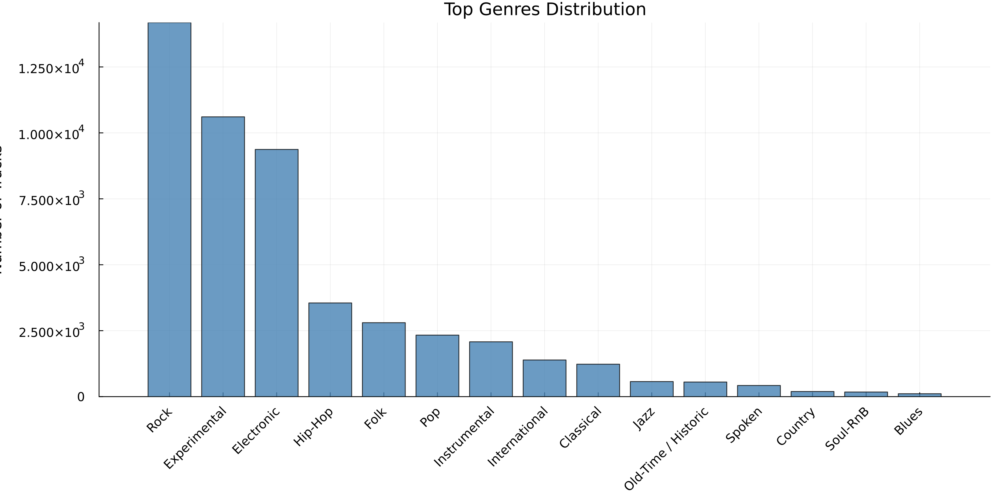


✓ Saved: genre_distribution.png

DURATION ANALYSIS

Duration Statistics (seconds):
  Count: 106558
  Mean: 277.89
  Median: 216.0
  Std Dev: 305.52
  Min: 1.0
  Max: 18350.0
  25th Percentile: 149.0
  75th Percentile: 306.0

Total Duration:
  Hours: 8225.41
  Days: 342.73


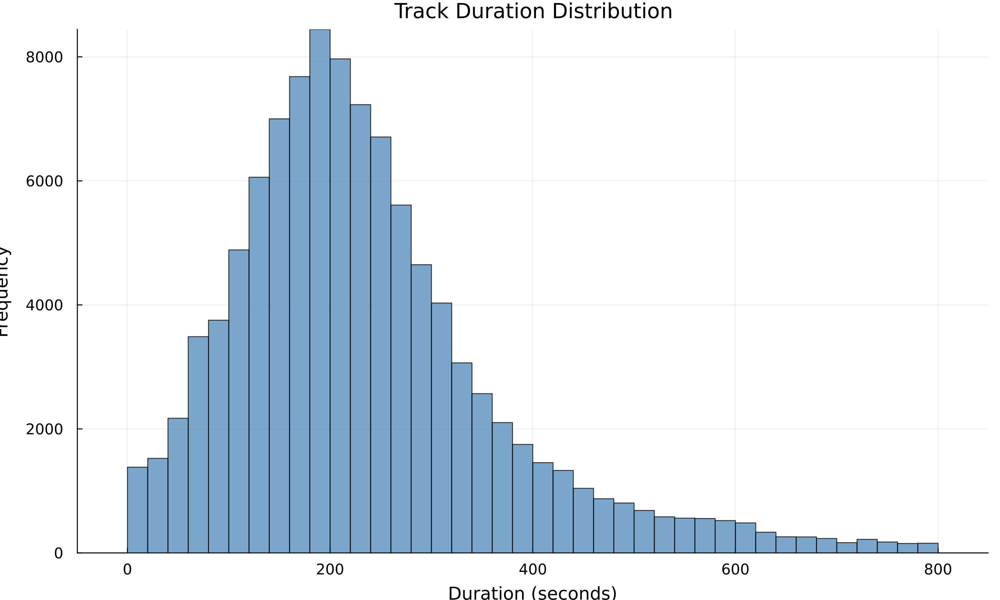


✓ Saved: duration_distribution.png


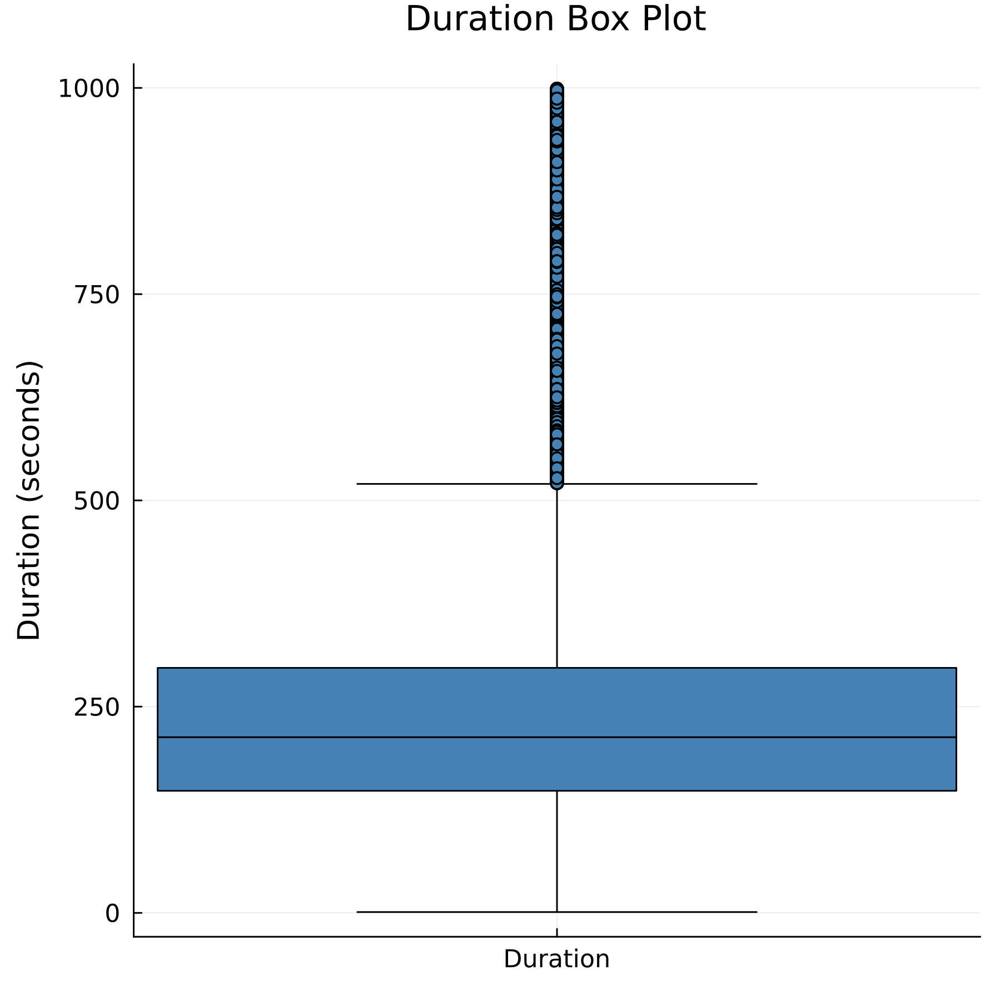

✓ Saved: duration_boxplot.png


In [6]:
# Execute metadata analysis
analyze_temporal_patterns(tracks)
genre_distribution = analyze_genres(tracks)
analyze_duration(tracks)

# SECTION 3: AUDIO FEATURES ANALYSIS


Feature Groups Created:
  zcr: 7 features
  chroma: 252 features
  spectral: 70 features
  other: 49 features
  mfcc: 140 features

FEATURE STATISTICS

zcr Features:
  Count: 7
  Mean range: [0.0023, 29.4646]
  Std range: [0.0052, 88.9754]

chroma Features:
  Count: 252
  Mean range: [-0.3651, 0.9999]
  Std range: [0.0054, 72.0719]

spectral Features:
  Count: 70
  Mean range: [-0.4212, 9249.8729]
  Std range: [0.2921, 1278.5184]

other Features:
  Count: 49
  Mean range: [-0.3073, 12.8843]
  Std range: [0.0061, 32.5827]

mfcc Features:
  Count: 140
  Mean range: [-525.5447, 234.038]
  Std range: [0.3245, 105.3886]

FEATURE DISTRIBUTION VISUALIZATION


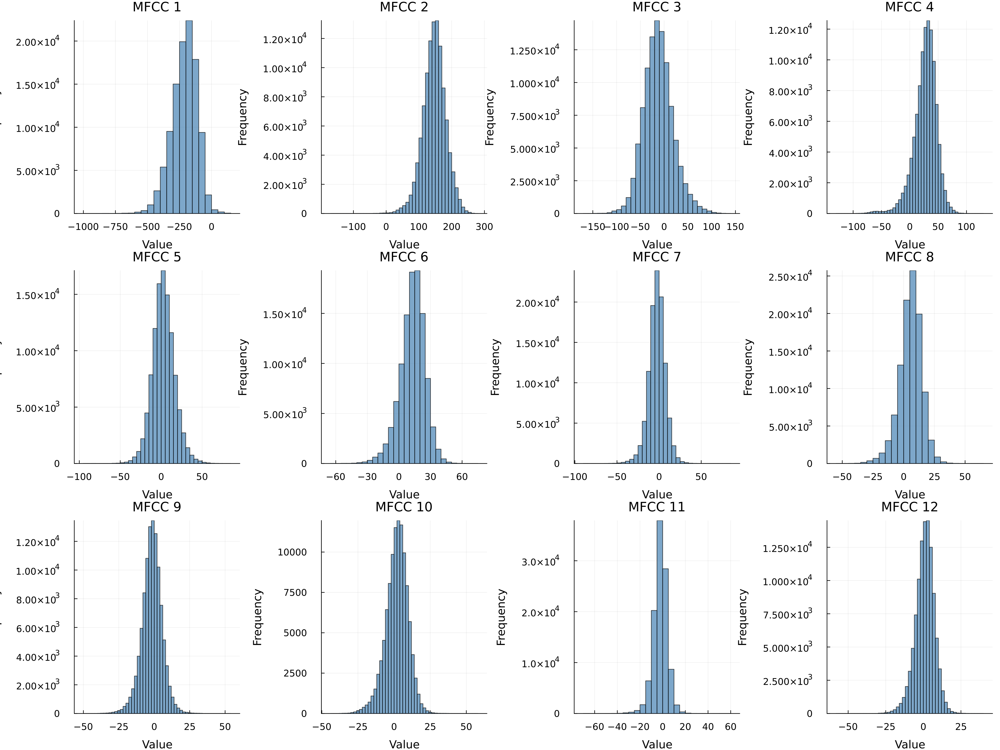

✓ Saved: mfcc_distributions.png


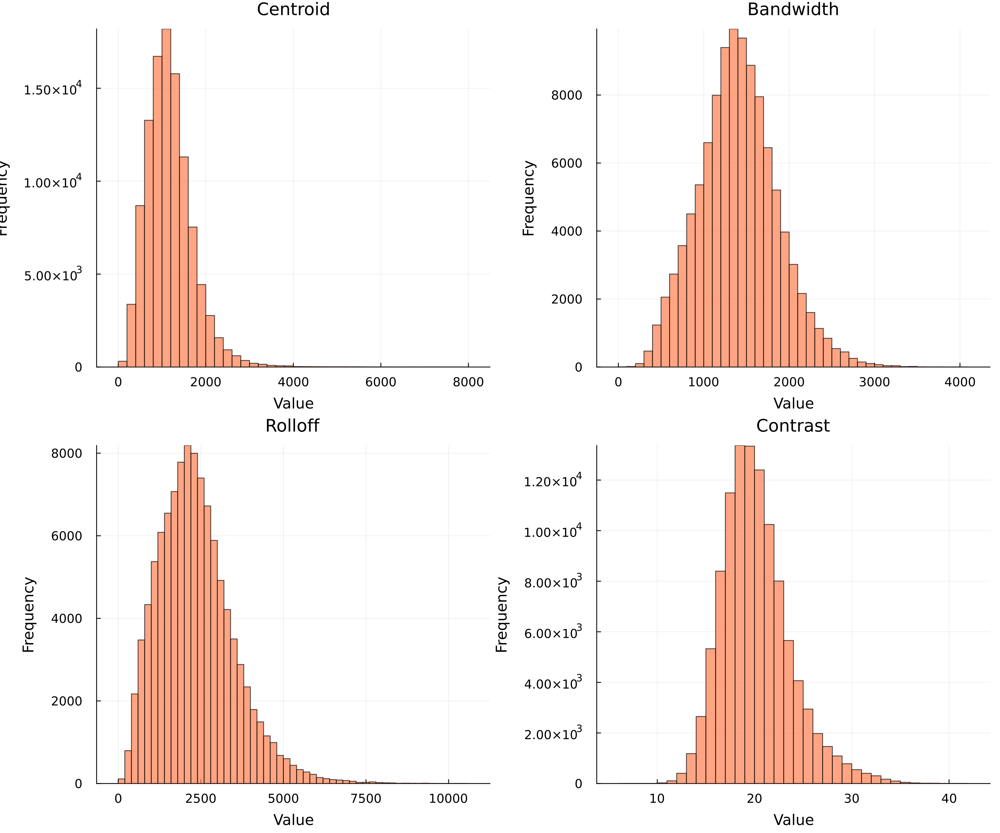

✓ Saved: spectral_features.png

FEATURE CORRELATION ANALYSIS

Highly Correlated Feature Pairs (|r| > 0.8):
  None found


In [7]:
# Execute feature analysis
feature_groups = organize_features(features)
feature_stats = compute_feature_statistics(features, feature_groups)
visualize_feature_distributions(features, feature_groups)
analyze_feature_correlations(features, feature_groups)

# SECTION 4: ADVANCED MULTIVARIATE ANALYSIS



PRINCIPAL COMPONENT ANALYSIS

Explained Variance by Component:
  PC1: 12.18% (Cumulative: 12.18%)
  PC2: 8.04% (Cumulative: 20.21%)
  PC3: 6.31% (Cumulative: 26.52%)
  PC4: 4.31% (Cumulative: 30.83%)
  PC5: 3.05% (Cumulative: 33.88%)
  PC6: 2.79% (Cumulative: 36.67%)
  PC7: 2.53% (Cumulative: 39.21%)
  PC8: 2.38% (Cumulative: 41.59%)
  PC9: 2.32% (Cumulative: 43.91%)
  PC10: 2.11% (Cumulative: 46.01%)
  PC11: 1.67% (Cumulative: 47.68%)
  PC12: 1.61% (Cumulative: 49.29%)
  PC13: 1.45% (Cumulative: 50.74%)
  PC14: 1.38% (Cumulative: 52.12%)
  PC15: 1.29% (Cumulative: 53.41%)


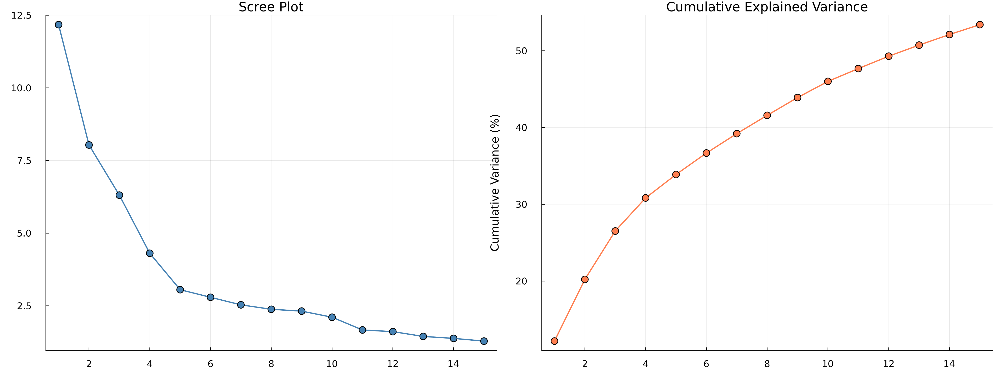

✓ Saved: pca_analysis.png

CLUSTERING ANALYSIS

Clustering Results:
  Number of clusters: 8
  Converged: true
  Iterations: 90

Cluster Sizes:
  Cluster 1: 1066 samples (21.32%)
  Cluster 2: 2 samples (0.04%)
  Cluster 3: 767 samples (15.34%)
  Cluster 4: 300 samples (6.0%)
  Cluster 5: 568 samples (11.36%)
  Cluster 6: 1231 samples (24.62%)
  Cluster 7: 27 samples (0.54%)
  Cluster 8: 1039 samples (20.78%)


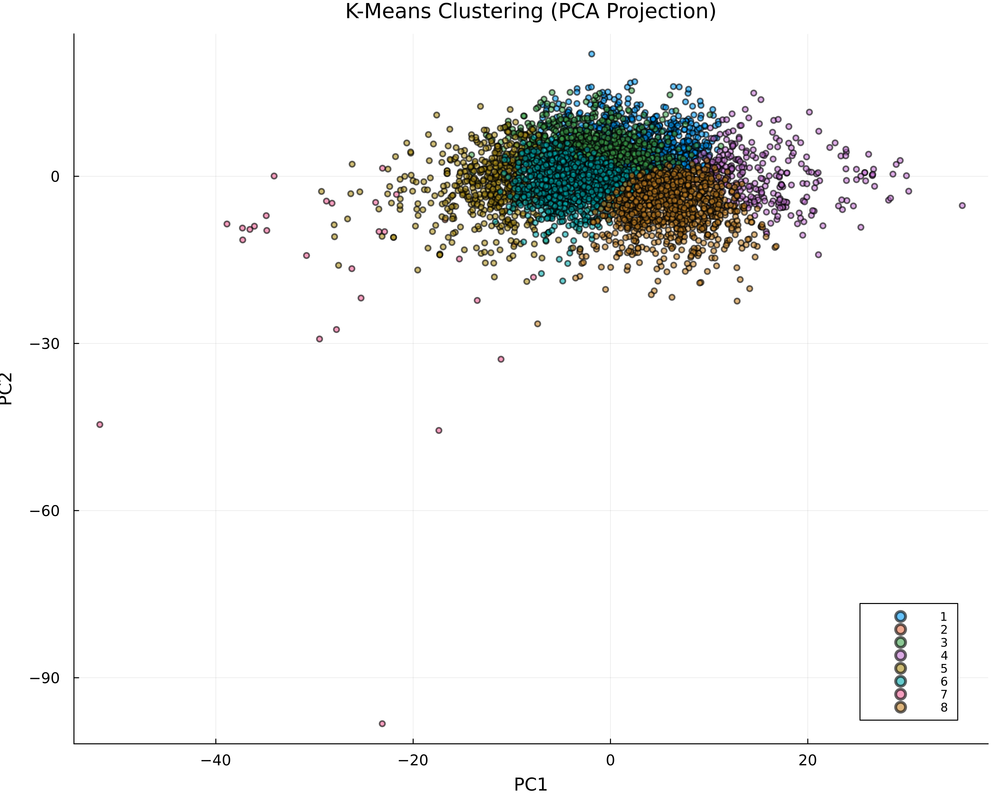

✓ Saved: clustering_analysis.png


KmeansResult{Matrix{Float64}, Float64, Int64}([-0.062047405971844424 10.480047977466558 … 1.3847383706403813 0.0031084037118917825; -0.046789579249605195 37.87934363464727 … 0.7949056330893787 -0.07852047904629567; … ; -0.164577879148256 4.171588245159704 … 0.20822834734642923 0.35783853587688164; 0.6724012528531111 -1.2393866941237484 … -0.1034537943903888 -0.45592482450570565], [3, 5, 3, 8, 8, 5, 6, 8, 3, 6  …  8, 2, 5, 3, 8, 3, 5, 6, 5, 1], [504.1657847731505, 369.9904302201463, 346.5630370797779, 527.4531653950388, 526.0268053417036, 291.52686161653304, 237.1250417889595, 459.59634473848234, 219.29474321273088, 413.34939160087873  …  200.82871607226951, 6178.265650734527, 661.5326779663187, 411.5895976603738, 629.4100606654312, 1409.6567905988572, 297.25797332606226, 212.46311994383697, 217.37703403287776, 266.5070559637266], [1066, 2, 767, 300, 568, 1231, 27, 1039], [1066, 2, 767, 300, 568, 1231, 27, 1039], 2.140628946531354e6, 90, true)

In [8]:
# Execute advanced analysis
pca_model, pca_data = perform_pca_analysis(features, 15)
clustering_result = perform_clustering_analysis(features, 8)

Attending to the small PCA analysis, the dataset has genuine high-dimensional complexity as the features are non-redundant and capture different aspects of audio content. The clustering analysis suggest that the audio feature space is relatively homogeneous with a few outliers, which aligns with the PCA finding of distributed variance across many components. 

# SECTION 5: GENRE-BASED ANALYSIS



GENRE-BASED FEATURE COMPARISON

Analyzing top 8 genres
  1. Rock: 14182 tracks
  2. Experimental: 10608 tracks
  3. Electronic: 9372 tracks
  4. Hip-Hop: 3552 tracks
  5. Folk: 2803 tracks
  6. Pop: 2332 tracks
  7. Instrumental: 2079 tracks
  8. International: 1389 tracks


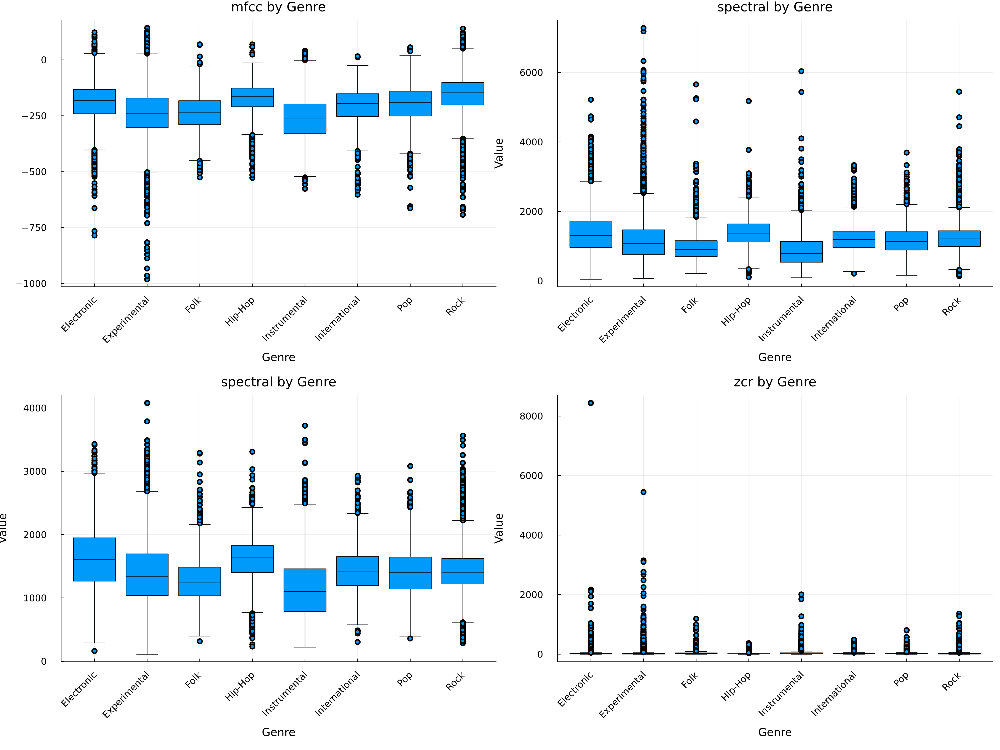


✓ Saved: genre_feature_comparison.png


In [9]:
# Execute genre-based analysis
compare_features_by_genre(tracks, features)

# SECTION 6: POPULARITY ANALYSIS


POPULARITY & SUCCESS ANALYSIS
Found popularity metrics: ["listens", "favorites", "comments", "interest"]


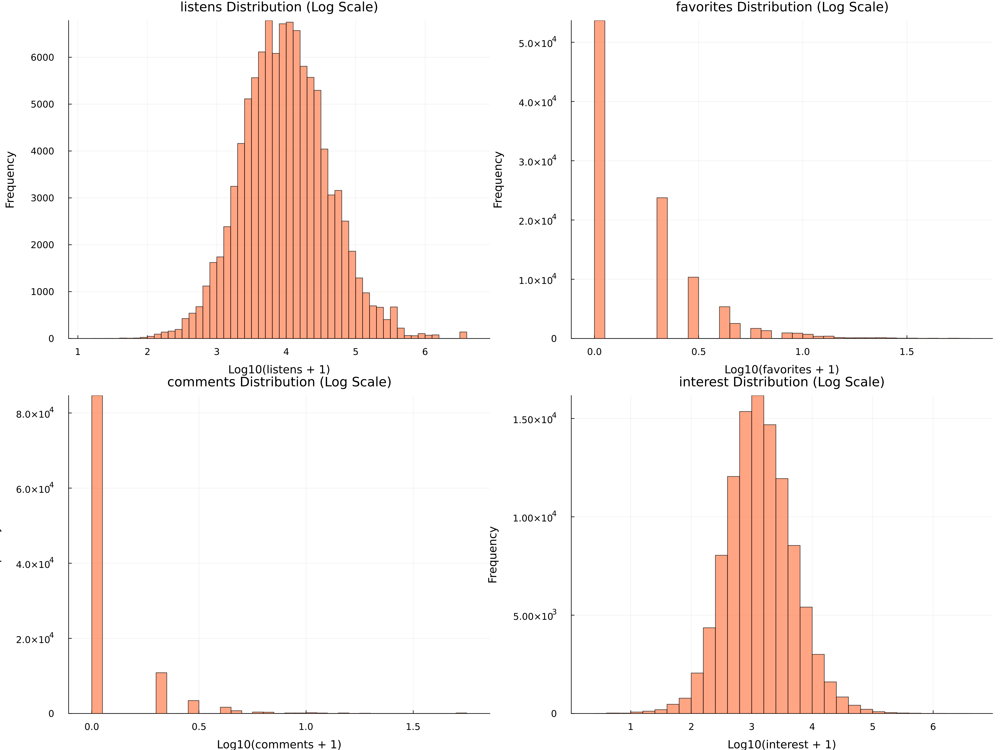

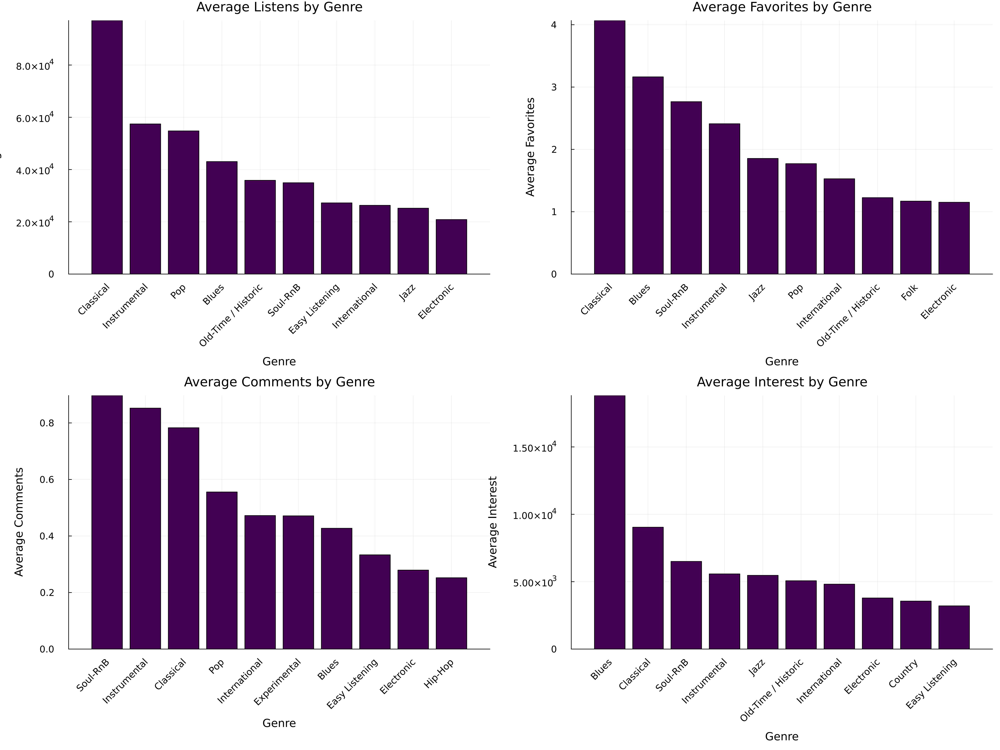

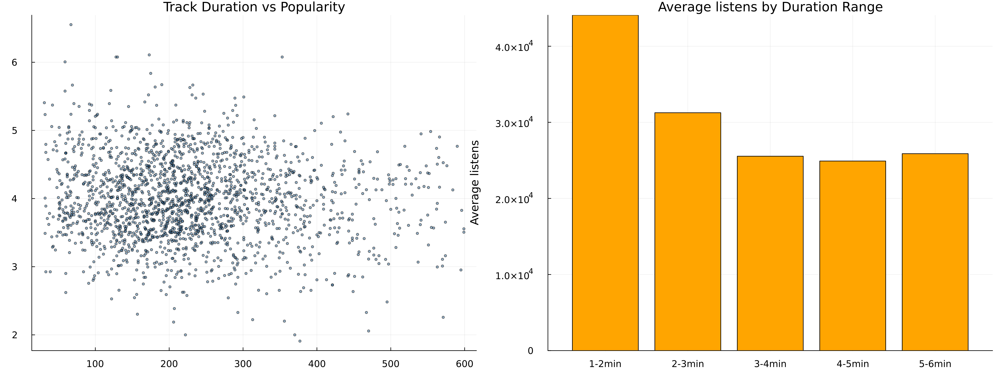


✓ Saved popularity analysis visualizations


In [11]:
# Run the popularity analysis
analyze_popularity_patterns(tracks)